In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn import preprocessing as pps
import seaborn as sns

In [11]:
# Wczytywanie danych. 
Metmast_Train = pd.read_csv("wind-farm-1-metmast-training.csv", sep = ";", parse_dates=['Timestamp'])
Metmast_Test = pd.read_csv("wind-farm-1-metmast-testing.csv", sep = ";", parse_dates=['Timestamp'])
Logs_Train = pd.read_csv("wind-farm-1-logs-training.csv", sep = ";", parse_dates=['TimeDetected', "TimeReset"])
Logs_Test = pd.read_csv("wind-farm-1-logs-testing.csv", sep = ";", parse_dates=['TimeDetected', "TimeReset"])
Signals_Train = pd.read_csv("wind-farm-1-signals-training.csv", sep = ";", parse_dates=['Timestamp'])
Signals_Test = pd.read_csv("wind-farm-1-signals-testing.csv", sep = ";", parse_dates=['Timestamp'])
Failures_Train = pd.read_csv("wind-farm-1-failures-training.csv", sep = ";", parse_dates=['Timestamp'])
Power_curve = pd.read_csv("Power_curve.csv")

In [3]:
Power_curve

,Wind speed (m/s),Power (kW)
0,4.0,89
1,4.5,142
2,5.0,204
3,5.5,279
4,6.0,368
5,6.5,470
6,7.0,594
7,7.5,736
8,8.0,896
9,8.5,1069


In [4]:
Signals_Train.Turbine_ID.drop_duplicates() # 5 turbin

0    T11
1    T06
2    T01
3    T09
4    T07
Name: Turbine_ID, dtype: object

In [5]:
Signals_Train.Turbine_ID.value_counts() # Podobna liczba obserwacji.

T11    87248
T07    87207
T09    87156
T01    87146
T06    85388
Name: Turbine_ID, dtype: int64

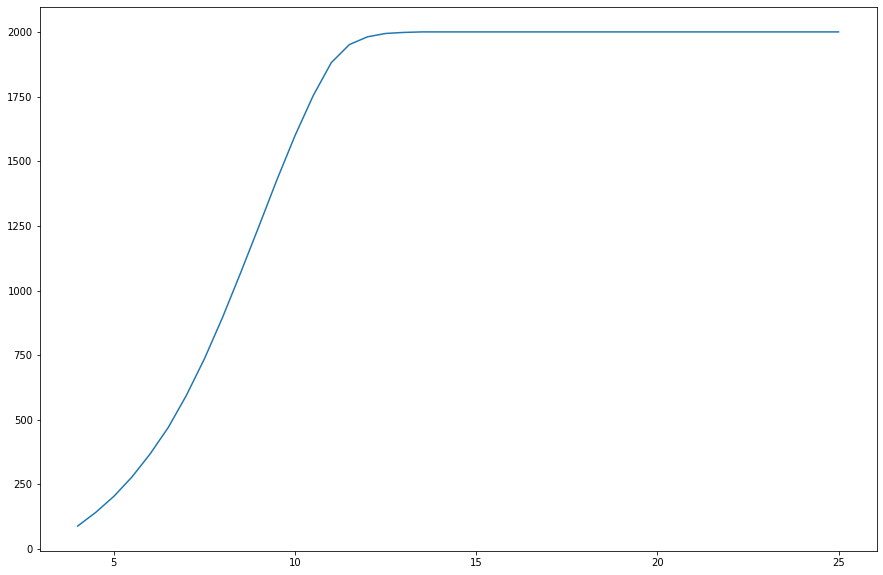

In [6]:
plt.figure(figsize = [15,10])
plt.plot(Power_curve["Wind speed (m/s)"], Power_curve["Power (kW)"]) # 2000 kW = maksymalna moc, wiatr od 4 do 25 
plt.show() # Teoretyczna krzywa...

In [15]:
Signals_Train = Signals_Train[["Turbine_ID", "Timestamp", "Grd_Prod_Pwr_Avg", "Amb_WindSpeed_Avg", "Amb_Temp_Avg", 
                               "Nac_Temp_Avg", "Rtr_RPM_Avg", "Gear_Bear_Temp_Avg", "Gen_RPM_Avg", "Gen_Bear2_Temp_Avg", 
                               "Gen_Bear_Temp_Avg"]].copy()

#Signals_Train = Signals_Train.loc[(Signals_Train.Amb_WindSpeed_Avg >=4) & (Signals_Train.Amb_WindSpeed_Avg <= 25)]
# Czy usuwać te obserwacje co są poza skalą z wiatrem? 434145  lub 280119 obserwacji, usuwanie może nie, bo będzie luka w czasie
# może jakoś inaczej uwzględniać w pracy
Signals_Train

,Turbine_ID,Timestamp,Grd_Prod_Pwr_Avg,Amb_WindSpeed_Avg,Amb_Temp_Avg,Nac_Temp_Avg,Rtr_RPM_Avg,Gear_Bear_Temp_Avg,Gen_RPM_Avg,Gen_Bear2_Temp_Avg,Gen_Bear_Temp_Avg
0,T11,2016-01-01 00:00:00+00:00,246.1,5.3,18,27,11.3,55,1270.9,38,42.0
1,T06,2016-01-01 00:00:00+00:00,62.5,3.8,18,29,11.1,48,1248.5,35,42.0
2,T01,2016-01-01 00:00:00+00:00,26.2,3.3,18,28,11.1,48,1249.0,37,41.0
3,T09,2016-01-01 00:00:00+00:00,198.4,5.2,18,29,11.2,48,1272.0,33,40.0
4,T07,2016-01-01 00:00:00+00:00,112.7,4.1,18,27,11.1,49,1254.9,39,41.0
...,...,...,...,...,...,...,...,...,...,...,...
434140,T11,2017-09-01 00:00:00+00:00,177.6,4.9,26,31,11.1,56,1250.6,43,46.0
434141,T09,2017-09-01 00:00:00+00:00,188.2,5.3,26,35,11.1,52,1251.9,40,44.0
434142,T06,2017-09-01 00:00:00+00:00,163.8,4.7,26,37,11.1,54,1252.4,45,49.0
434143,T01,2017-09-01 00:00:00+00:00,183.9,5.1,26,34,11.1,53,1255.3,44,45.0


In [16]:
power_curve_fit = np.poly1d(np.polyfit(Power_curve["Wind speed (m/s)"], Power_curve["Power (kW)"], 13))
# Dopasowany wielomian do skalowania..

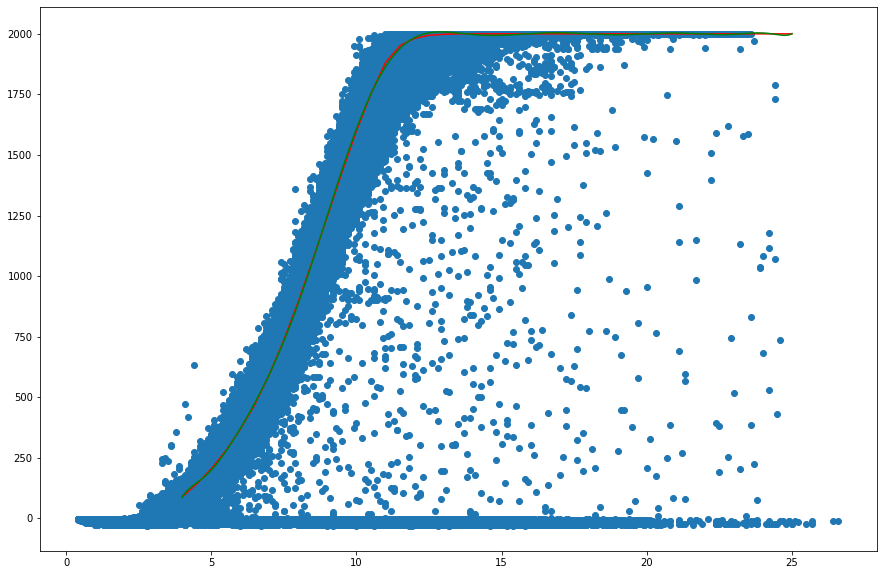

In [17]:
# Dane dla wszystkich turbin łącznie..
plt.figure(figsize = [15,10])
plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Signals_Train.Grd_Prod_Pwr_Avg)
plt.plot(Power_curve["Wind speed (m/s)"], Power_curve["Power (kW)"], color = "red")
plt.plot(np.linspace(4, 25, 1000), power_curve_fit(np.linspace(4, 25, 1000)), color = "green")
plt.show() # Do odcięcia dane z prędkością wiatru mniejszą od 4 i większą od 25.

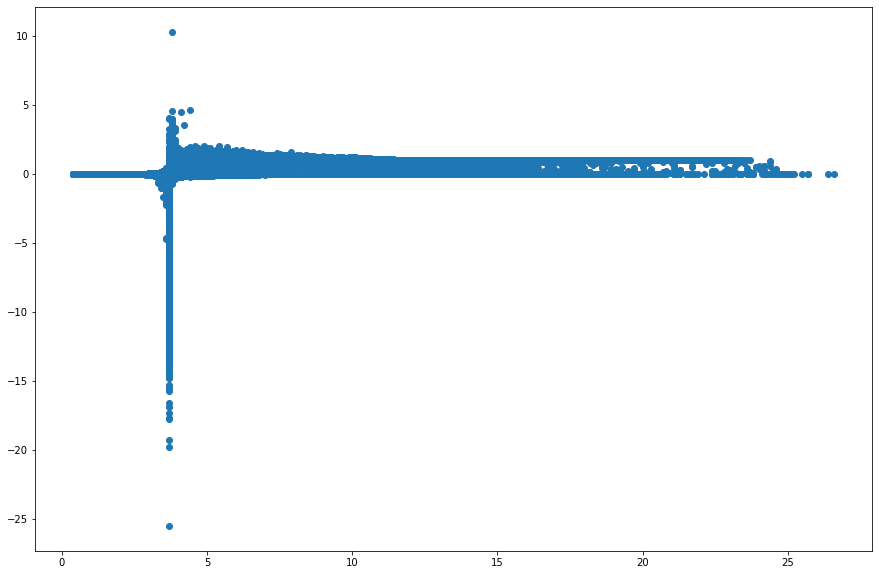

In [18]:
# Coś dziwnie xD Bo tutaj uwzględniamy obserwacje poniżej 4 i powyżej 25..
Scale_Power = Signals_Train.Grd_Prod_Pwr_Avg / power_curve_fit(Signals_Train.Amb_WindSpeed_Avg)
plt.figure(figsize = [15,10])
plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Scale_Power)
plt.show()

In [53]:
Signals_Train = Signals_Train.loc[(Signals_Train.Amb_WindSpeed_Avg >=4) & (Signals_Train.Amb_WindSpeed_Avg <= 25)]
# Usunięcie danych do skalowania według krzywej...

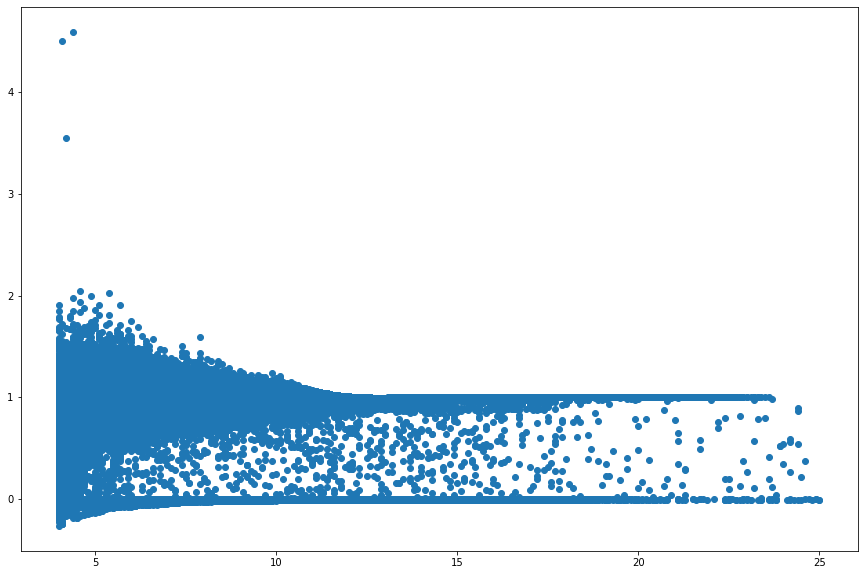

In [54]:
Scale_Power = Signals_Train.Grd_Prod_Pwr_Avg / power_curve_fit(Signals_Train.Amb_WindSpeed_Avg)
plt.figure(figsize = [15,10])
plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Scale_Power)
plt.show() # Lepiej, bo krzywa jest dobrze określona pod 4 do 25, (Może przedłużenie 0 z lewej i 2000 z prawej?)

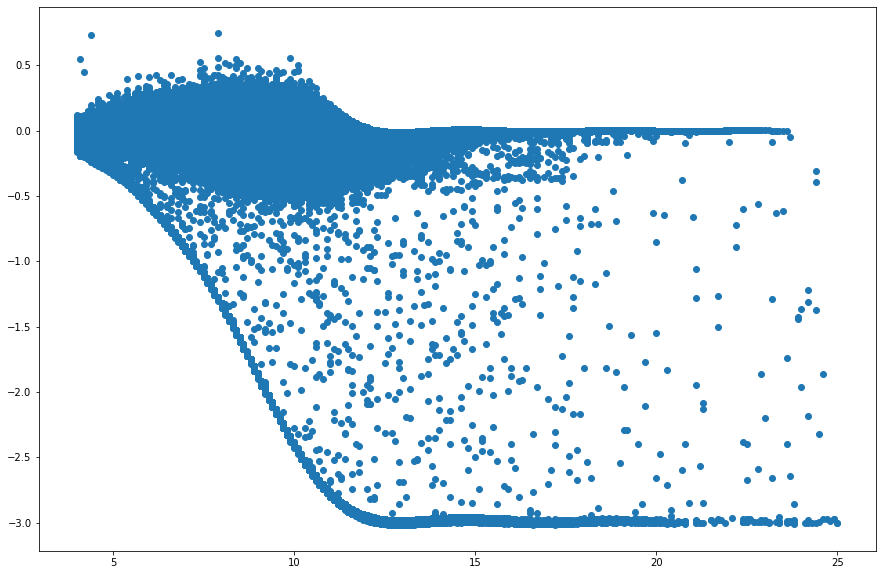

In [55]:
Scale_Power = (Signals_Train.Grd_Prod_Pwr_Avg - power_curve_fit(Signals_Train.Amb_WindSpeed_Avg))/np.std(Signals_Train.Grd_Prod_Pwr_Avg)
plt.figure(figsize = [15,10])
plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Scale_Power)
plt.show() 
# Odjęcie teoretycznej krzywej i podzielenie przez sd w całej populacji..
# Chyba widać, wygaszanie, o którym mówiła Agnieszka. Jakoś uwzględnić wygaszanie wiatraków, gdy wiatr spada lub zbyt silny?

In [63]:
Scale_Power = Signals_Train.Grd_Prod_Pwr_Avg - power_curve_fit(Signals_Train.Amb_WindSpeed_Avg)
Scale_Power = Signals_Train[["Turbine_ID", "Grd_Prod_Pwr_Avg"]].groupby("Turbine_ID").\
               apply(lambda x : np.std(x))
#plt.figure(figsize = [15,10])
#plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Scale_Power)
#plt.show() 
# Odjęcie teoretycznej krzywej i podzielenie przez sd w grupach

,Grd_Prod_Pwr_Avg
Turbine_ID,
T01,676.060159
T06,699.696968
T07,705.166222
T09,654.479558
T11,635.202869


In [50]:
Signals_Train = pd.read_csv("wind-farm-1-signals-training.csv", sep = ";", parse_dates=['Timestamp'])

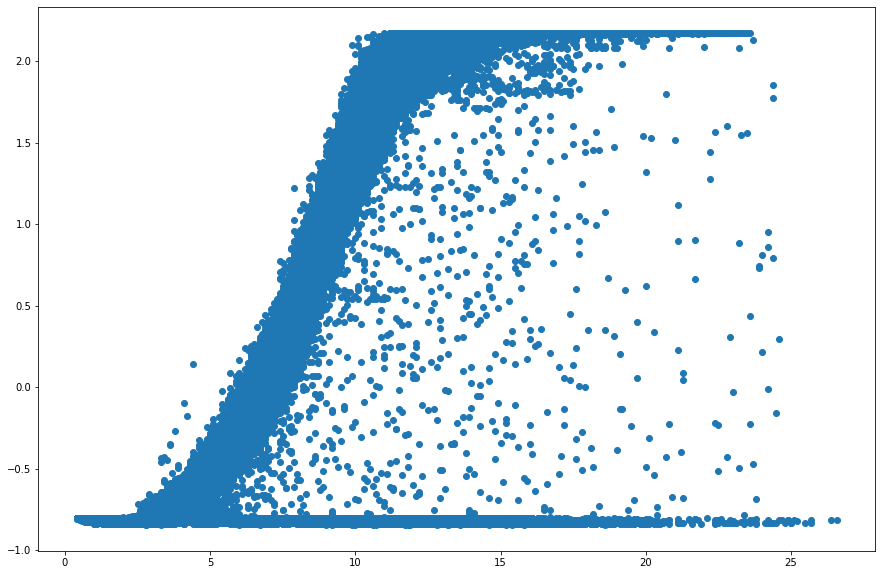

In [51]:
# Zwykłe skalowanie - mean i sd
Scale_Power2 = pps.scale(Signals_Train.Grd_Prod_Pwr_Avg)
plt.figure(figsize = [15,10])
plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Scale_Power2)
plt.show()

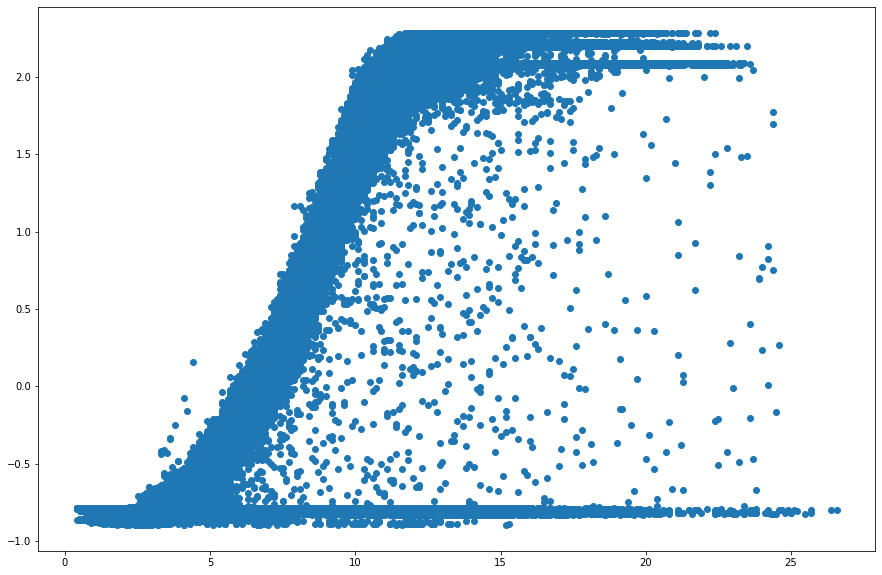

In [52]:
# Zwykłe skalowanie w grupach - mean i sd
Scale_Power3 = Signals_Train[["Turbine_ID", "Grd_Prod_Pwr_Avg"]].groupby("Turbine_ID").\
               apply(lambda x : (x - np.mean(x))/np.std(x))
plt.figure(figsize = [15,10])
plt.scatter(Signals_Train.Amb_WindSpeed_Avg, Scale_Power3)
plt.show()

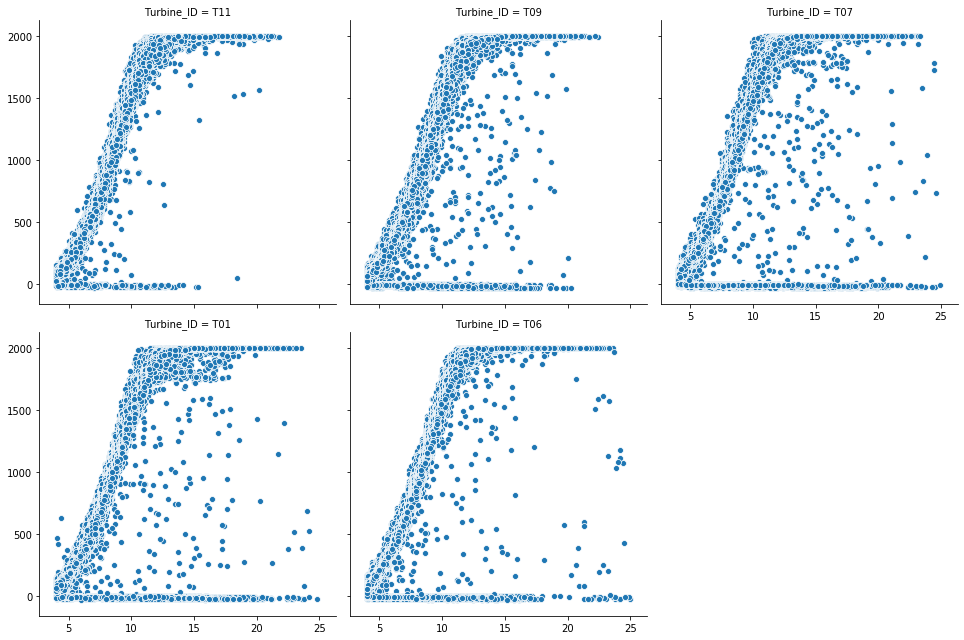

In [158]:
facet = sns.FacetGrid(Signals_Train, col = "Turbine_ID", height = 4.5, col_wrap = 3)
facet.map_dataframe(sns.scatterplot, x = "Amb_WindSpeed_Avg", y = "Grd_Prod_Pwr_Avg")
plt.show() # Turbiny mają różną sprawność lub wpływ odległości od stacji mierzącej ... Czy da się jakoś uwzględnić? 
# Chyba brak danych o rozmieszczeniu, może skalować w grupach jednak.

C:\Users\Daniel\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\Daniel\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


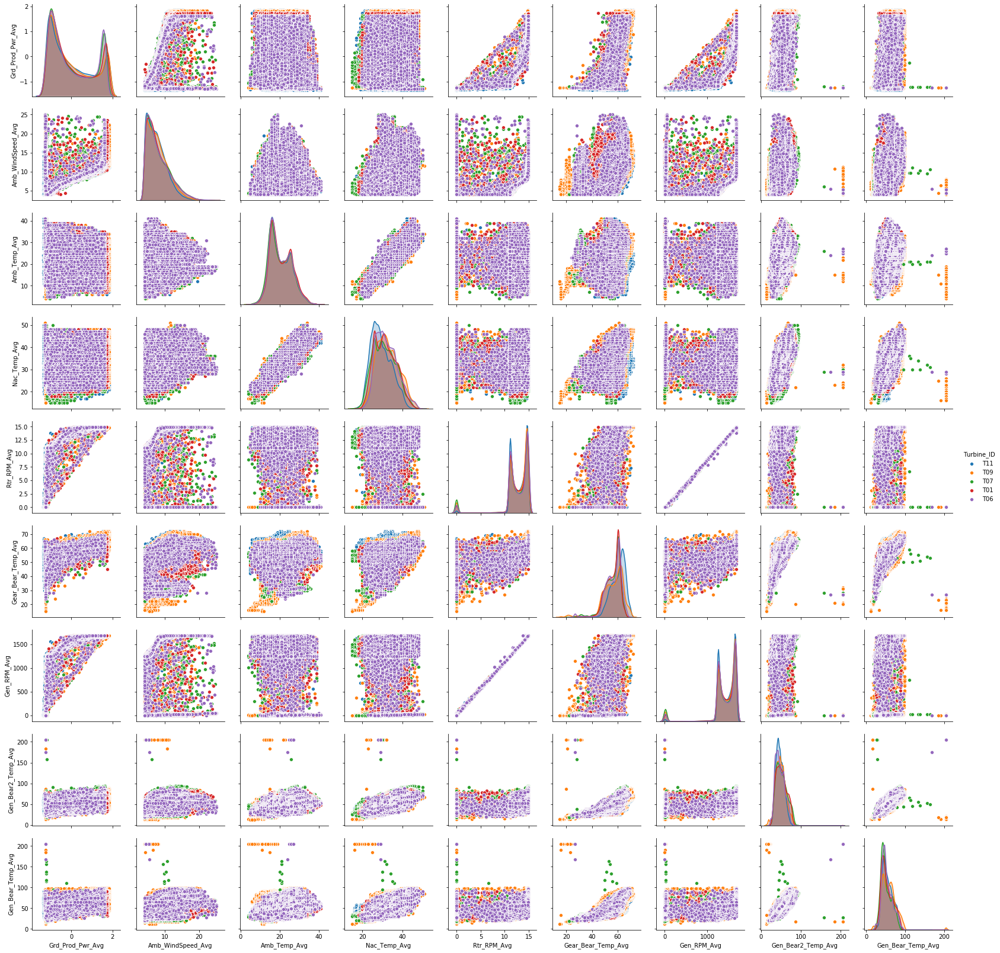

In [211]:
sns.pairplot(Signals_Train.drop(columns = "Timestamp"), hue = "Turbine_ID") # Braki danych uzupełnić !!!!

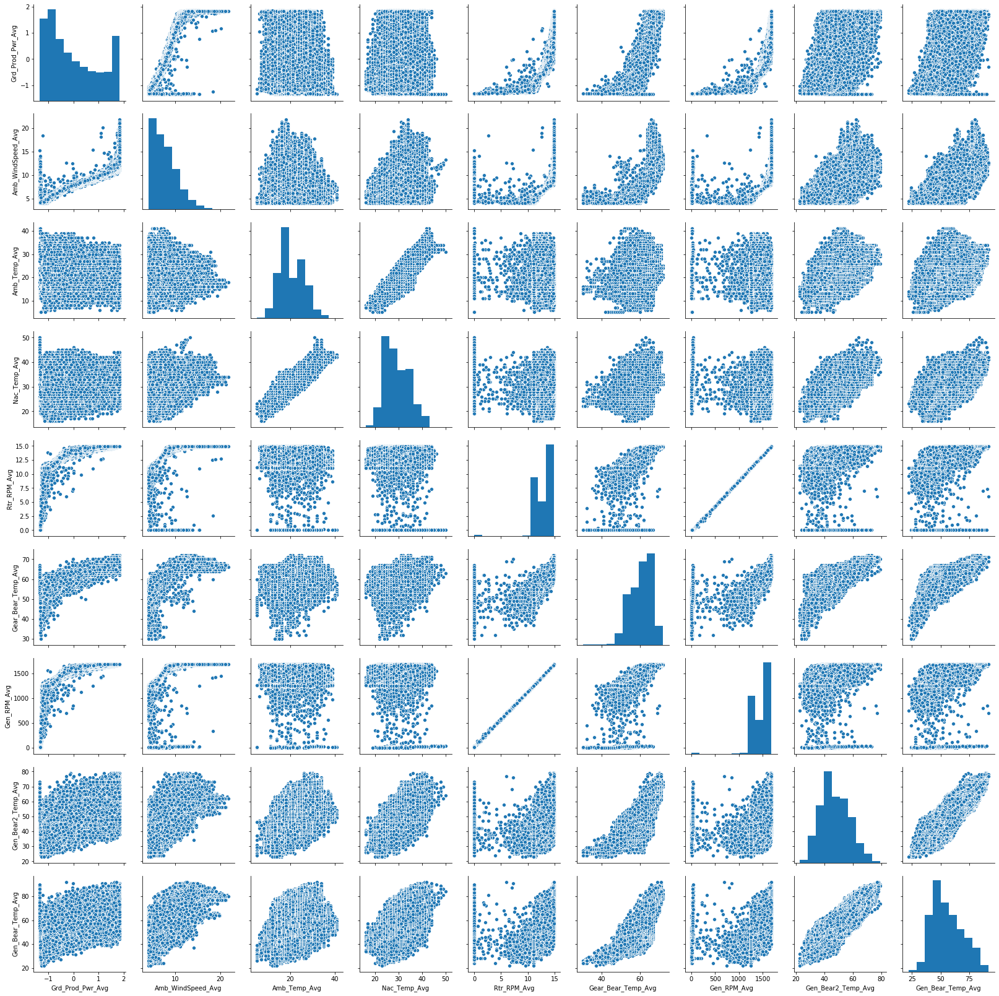

In [212]:
sns.pairplot(Signals_Train.drop(columns = "Timestamp")[Signals_Train.Turbine_ID == "T11"])

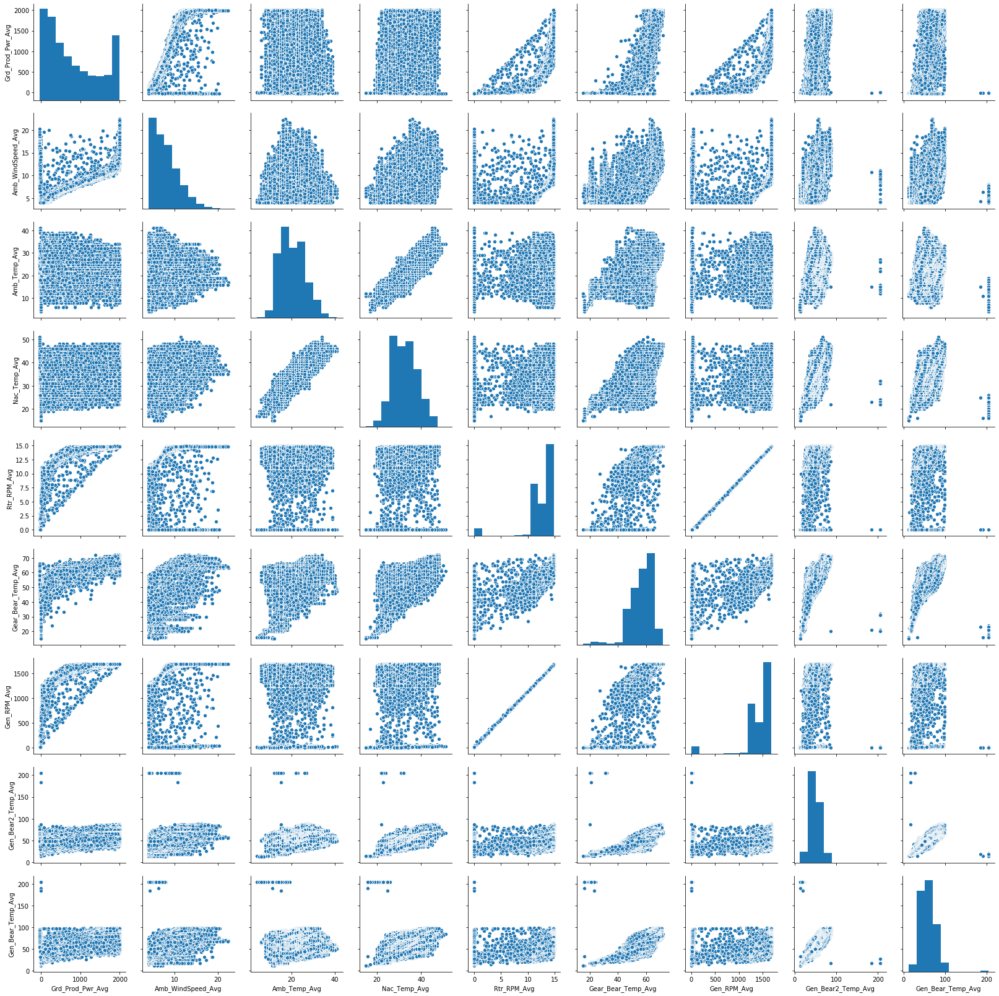

In [161]:
sns.pairplot(Signals_Train.drop(columns = "Timestamp")[Signals_Train.Turbine_ID == "T09"])

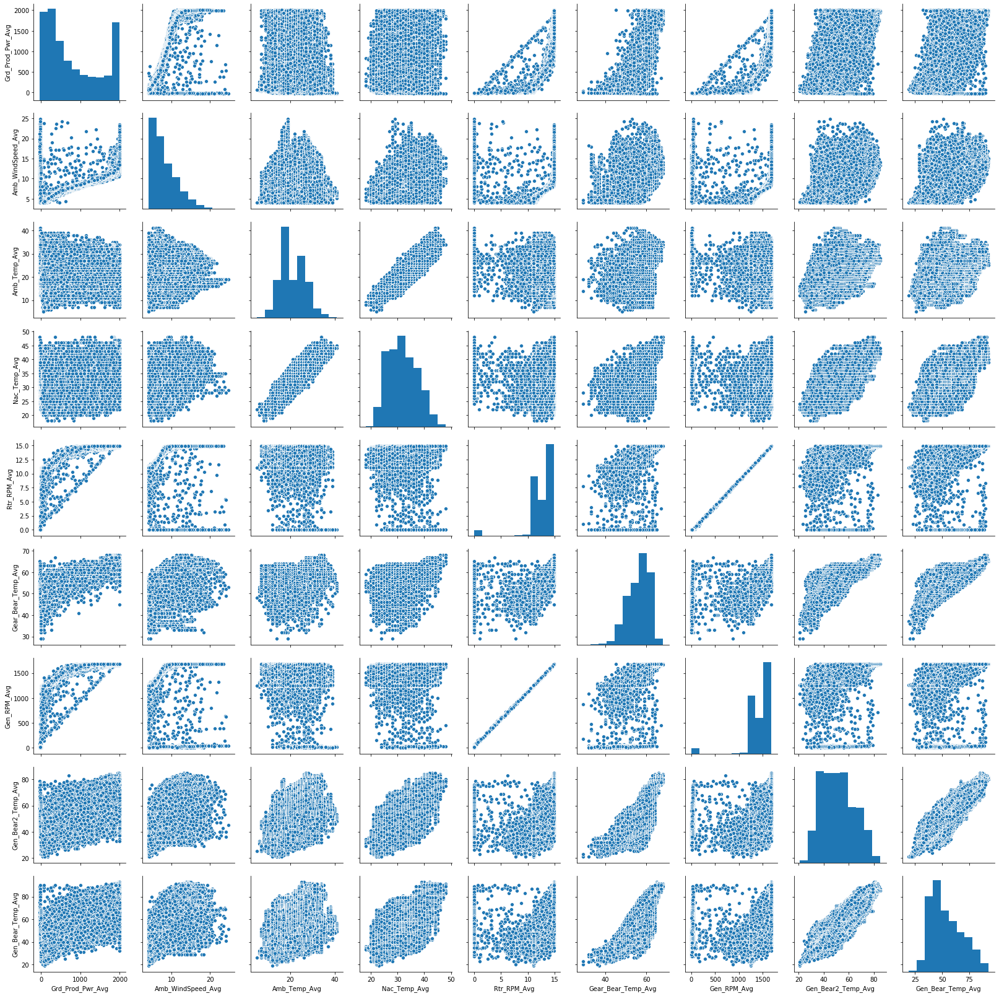

In [162]:
sns.pairplot(Signals_Train.drop(columns = "Timestamp")[Signals_Train.Turbine_ID == "T01"])

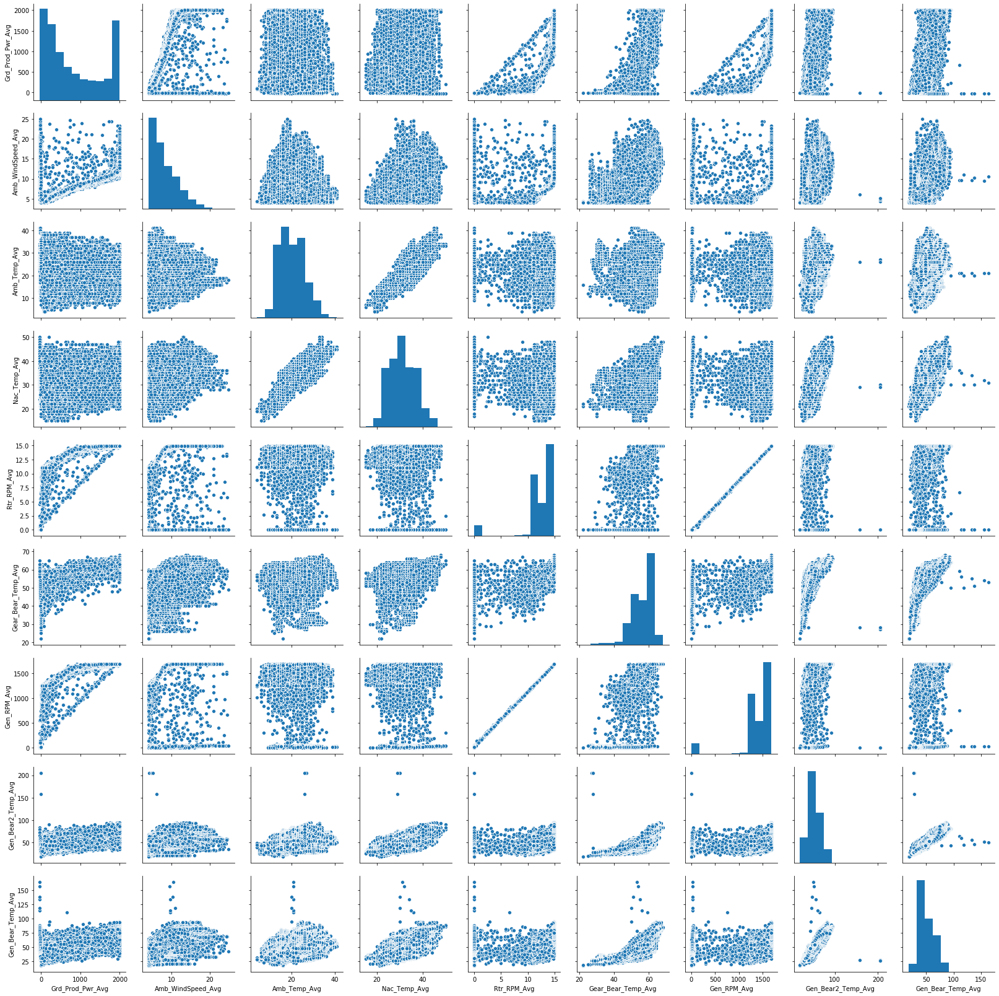

In [163]:
sns.pairplot(Signals_Train.drop(columns = "Timestamp")[Signals_Train.Turbine_ID == "T07"])

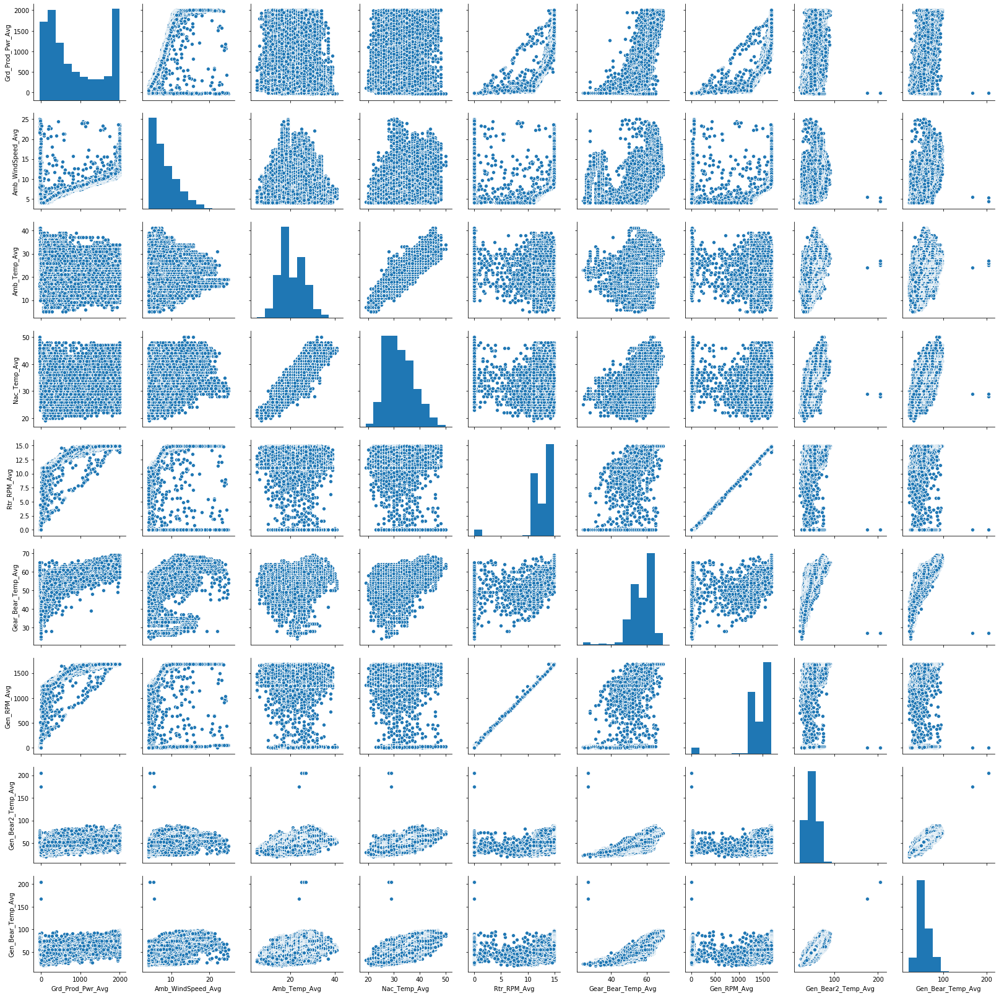

In [164]:
sns.pairplot(Signals_Train.drop(columns = "Timestamp")[Signals_Train.Turbine_ID == "T06"])

In [ ]:
# Temperatura ma duże obserwacje odstające.. Gear_Bear2_Temp_Avg oraz Gear_Bear_Temp_Avg.
# Turbiny T11 oraz T01 mają inne wykresy rozproszenia od pozostałych. 
# Czy są to potencjalne awarie?
# Silna korelacja Gen_RMP_Avg oraz Rtr_RMP_AVG

In [198]:
np.corrcoef(Signals_Train.Gen_RPM_Avg, Signals_Train.Rtr_RPM_Avg) # Do usunięcia zmienna Rtr_RPM_Avg - ta sama informacja.

array([[1.        , 0.99988055],
       [0.99988055, 1.        ]])

C:\Users\Daniel\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\Daniel\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


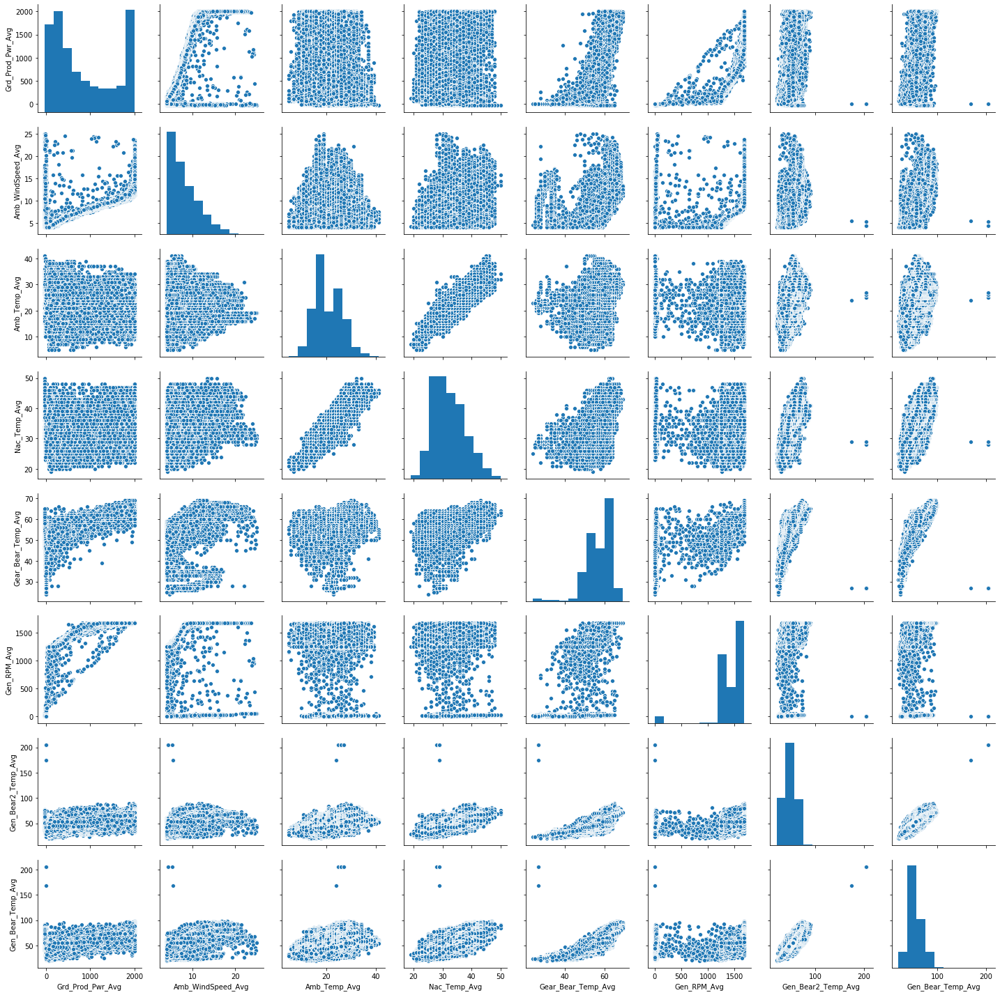

In [199]:
sns.pairplot(Signals_Train.drop(columns = {"Timestamp", "Rtr_RPM_Avg"})[Signals_Train.Turbine_ID == "T06"])

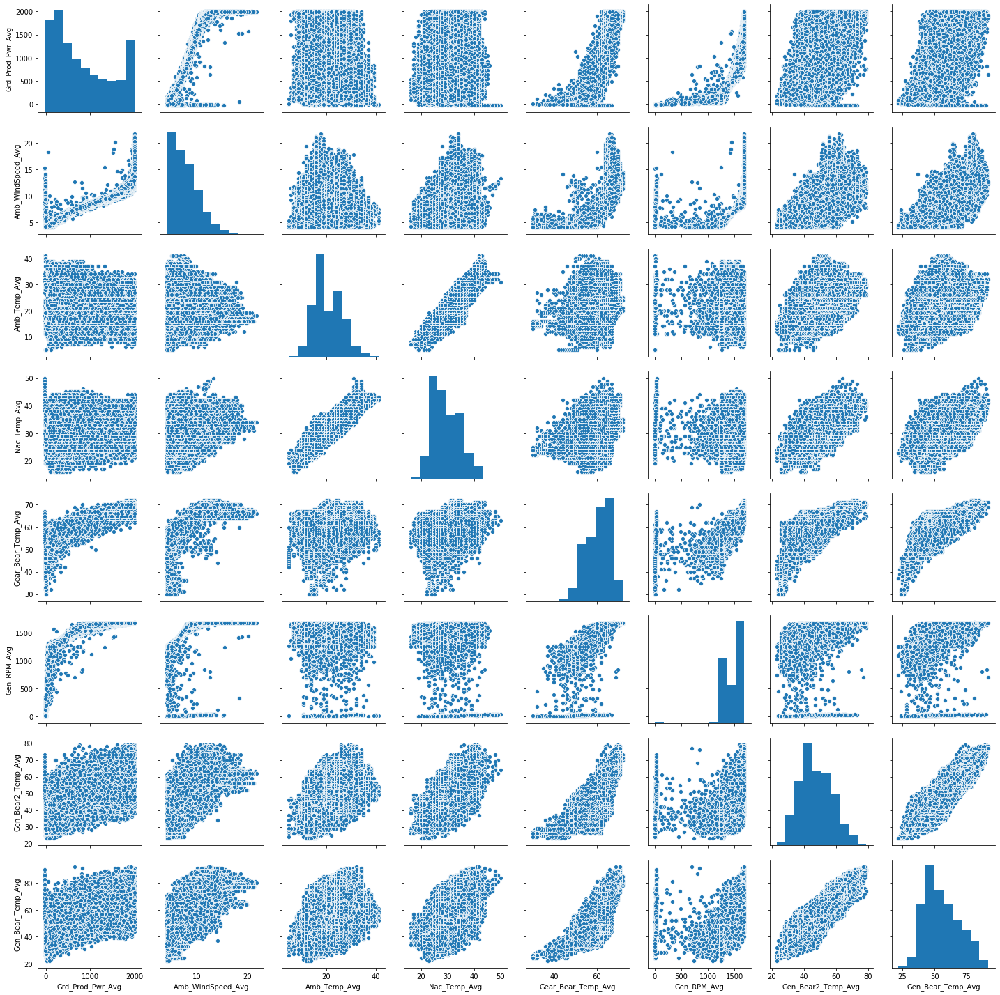

In [200]:
sns.pairplot(Signals_Train.drop(columns = {"Timestamp", "Rtr_RPM_Avg"})[Signals_Train.Turbine_ID == "T11"])

In [221]:
ST_NORM = Signals_Train.drop(columns = "Timestamp").groupby("Turbine_ID").apply(lambda x : (x - np.mean(x))/np.std(x))
# Normalizacja pozostałych kolumn? 

C:\Users\Daniel\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\Daniel\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


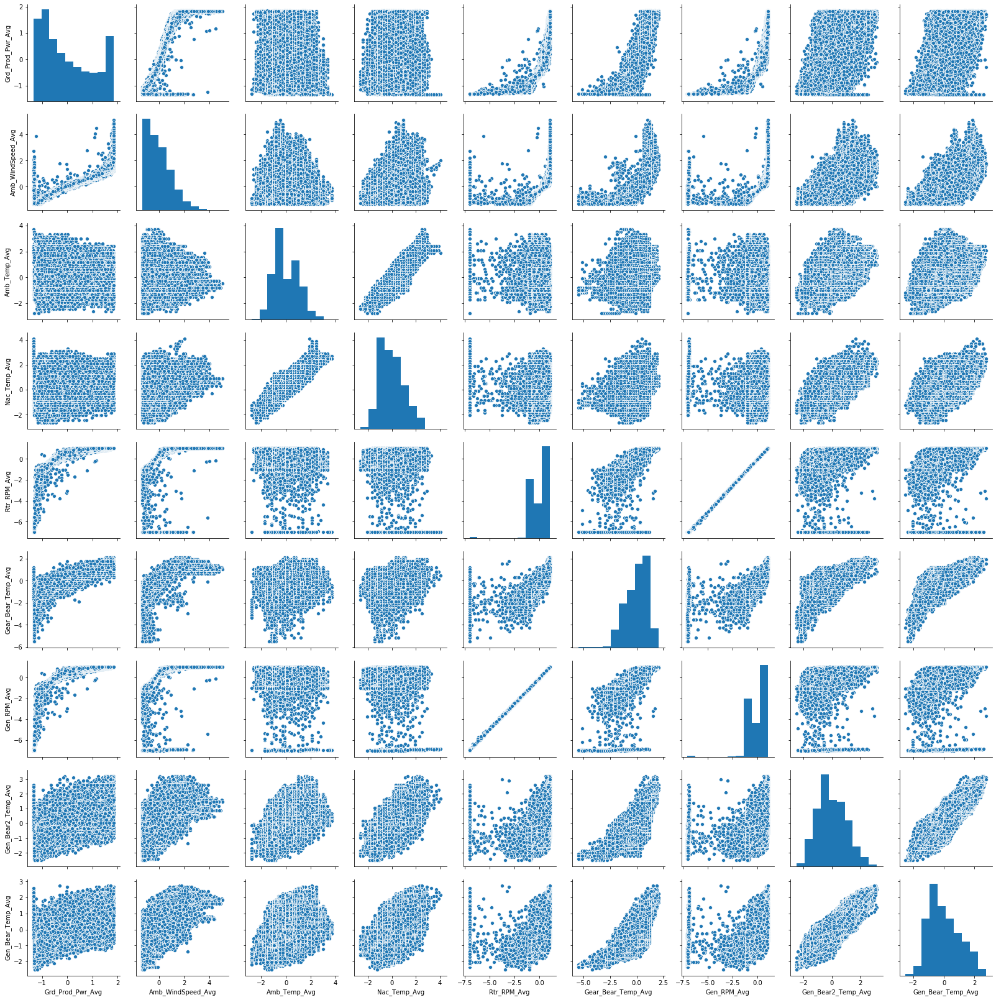

In [222]:
sns.pairplot(ST_NORM[Signals_Train.Turbine_ID == "T11"]) # Normalizacja wszystkiego nic nie zmienia..

In [22]:
DF = Signals_Train.merge(Failures_Train, "outer", on = ["Turbine_ID", "Timestamp"], sort = True)
# Uzupełnić braki danych. Czy da się sprytnie oprócz przechodzenia po kolei po kolumnach?

In [42]:
DF["Failure"] = (~pd.isna(DF.Component)).astype("int32")
DF

,Turbine_ID,Timestamp,Grd_Prod_Pwr_Avg,Amb_WindSpeed_Avg,Amb_Temp_Avg,Nac_Temp_Avg,Rtr_RPM_Avg,Gear_Bear_Temp_Avg,Gen_RPM_Avg,Gen_Bear2_Temp_Avg,Gen_Bear_Temp_Avg,Component,Remarks,Failure
0,T01,2016-01-01 00:20:00+00:00,59.0,4.3,18.0,29.0,6.8,46.0,774.0,37.0,41.0,NaN,NaN,0
1,T01,2016-01-01 00:30:00+00:00,135.7,4.4,18.0,28.0,11.1,48.0,1257.1,36.0,40.0,NaN,NaN,0
2,T01,2016-01-01 00:40:00+00:00,98.9,4.1,18.0,28.0,11.1,48.0,1257.7,36.0,40.0,NaN,NaN,0
3,T01,2016-01-01 00:50:00+00:00,320.3,6.0,18.0,28.0,11.8,50.0,1328.5,36.0,40.0,NaN,NaN,0
4,T01,2016-01-01 01:00:00+00:00,168.7,5.1,18.0,28.0,11.2,50.0,1265.5,37.0,40.0,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280136,T11,2017-08-31 23:20:00+00:00,303.8,5.9,26.0,31.0,11.4,57.0,1286.1,42.0,43.0,NaN,NaN,0
280137,T11,2017-08-31 23:30:00+00:00,149.6,5.0,26.0,31.0,11.1,56.0,1249.8,42.0,43.0,NaN,NaN,0
280138,T11,2017-08-31 23:40:00+00:00,82.6,4.3,26.0,31.0,11.1,55.0,1248.8,43.0,44.0,NaN,NaN,0
280139,T11,2017-08-31 23:50:00+00:00,130.6,4.8,26.0,31.0,11.1,55.0,1250.5,43.0,45.0,NaN,NaN,0


In [47]:
DF.loc[~pd.isna(DF.Remarks)].Remarks #Tylko 23 awarie, różne typy. Planowe prawdopodobnie 4..

17249                                  Gearbox pump damaged
53273                               Transformer fan damaged
62696                             Error in pitch regulation
71610                                    Generator replaced
71874                  Generator temperature sensor failure
76061                      High temperature generator error
78504     Refrigeration system and temperature sensors i...
80521                                    Generator replaced
107592                                   Oil leakage in Hub
118759    High temperature in generator bearing (replace...
125861                         High temperature transformer
130367    High temperature transformer. Transformer refr...
159454                                   Oil leakage in Hub
165078                           Generator bearings damaged
165275                                    Generator damaged
179853                High tempemperature generator bearing
187172                   High temperatur

In [48]:
DF

,Turbine_ID,Timestamp,Grd_Prod_Pwr_Avg,Amb_WindSpeed_Avg,Amb_Temp_Avg,Nac_Temp_Avg,Rtr_RPM_Avg,Gear_Bear_Temp_Avg,Gen_RPM_Avg,Gen_Bear2_Temp_Avg,Gen_Bear_Temp_Avg,Component,Remarks,Failure
0,T01,2016-01-01 00:20:00+00:00,59.0,4.3,18.0,29.0,6.8,46.0,774.0,37.0,41.0,NaN,NaN,0
1,T01,2016-01-01 00:30:00+00:00,135.7,4.4,18.0,28.0,11.1,48.0,1257.1,36.0,40.0,NaN,NaN,0
2,T01,2016-01-01 00:40:00+00:00,98.9,4.1,18.0,28.0,11.1,48.0,1257.7,36.0,40.0,NaN,NaN,0
3,T01,2016-01-01 00:50:00+00:00,320.3,6.0,18.0,28.0,11.8,50.0,1328.5,36.0,40.0,NaN,NaN,0
4,T01,2016-01-01 01:00:00+00:00,168.7,5.1,18.0,28.0,11.2,50.0,1265.5,37.0,40.0,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280136,T11,2017-08-31 23:20:00+00:00,303.8,5.9,26.0,31.0,11.4,57.0,1286.1,42.0,43.0,NaN,NaN,0
280137,T11,2017-08-31 23:30:00+00:00,149.6,5.0,26.0,31.0,11.1,56.0,1249.8,42.0,43.0,NaN,NaN,0
280138,T11,2017-08-31 23:40:00+00:00,82.6,4.3,26.0,31.0,11.1,55.0,1248.8,43.0,44.0,NaN,NaN,0
280139,T11,2017-08-31 23:50:00+00:00,130.6,4.8,26.0,31.0,11.1,55.0,1250.5,43.0,45.0,NaN,NaN,0
